<a href="https://colab.research.google.com/github/Joe-KI333/YOLOv8-OBB-CUSTOM-DATASET/blob/main/YOLOv8_OBB_custom_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [1]:
!nvidia-smi

Tue Mar  5 11:35:36 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## Install YOLOv8

In [2]:
!pip install ultralytics

from IPython import display
display.clear_output()
from IPython.display import display, Image

import ultralytics
ultralytics.checks()
from ultralytics import YOLO

Ultralytics YOLOv8.1.23 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.3/78.2 GB disk)


## CLI Basics

If you want to train, validate or run inference on models and don't need to make any modifications to the code, using YOLO command line interface is the easiest way to get started. Read more about CLI in [Ultralytics YOLO Docs](https://docs.ultralytics.com/usage/cli/).

```
yolo task=detect    mode=train    model=yolov8n.yaml      args...
          classify       predict        yolov8n-cls.yaml  args...
          segment        val            yolov8n-seg.yaml  args...
                         export         yolov8n.pt        format=onnx  args...
```

## Custom Dataset

In [3]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="NJpzXwEKxX8jfOlAtF68")
project = rf.workspace("wei-guo").project("gwhd2021")
dataset = project.version(3).download("yolov8-obb")


mkdir: cannot create directory ‘{HOME}/datasets’: No such file or directory
[Errno 2] No such file or directory: '{HOME}/datasets'
/content
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.2/70.2 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.9 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to GWHD2021-3 in yolov8-obb:: 100%|██████████| 13040/13040 [00:06<00:00, 2140.14it/s]


## Custom Training

In [4]:
%cd {HOME}

!yolo task=obb mode=train model=yolov8n-obb.pt data={dataset.location}/data.yaml epochs=30 imgsz=640 batch=8

[Errno 2] No such file or directory: '{HOME}'
/content
100% 6.24M/6.24M [00:00<00:00, 182MB/s]
Ultralytics YOLOv8.1.23 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=obb, mode=train, model=yolov8n-obb.pt, data=/content/GWHD2021-3/data.yaml, epochs=30, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frame

In [7]:
%cd {HOME}

!yolo task=obb mode=val model=/content/runs/obb/train/weights/best.pt data={dataset.location}/data.yaml epochs=30 imgsz=640 batch=8

[Errno 2] No such file or directory: '{HOME}'
/content
Ultralytics YOLOv8.1.23 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n-obb summary (fused): 187 layers, 3077414 parameters, 0 gradients, 8.3 GFLOPs
val: Scanning /content/GWHD2021-3/valid/labels.cache... 1303 images, 29 backgrounds, 0 corrupt: 100% 1303/1303 [00:00<?, ?it/s]
val: WARNING ⚠️ /content/GWHD2021-3/valid/images/9f697765bd41325baaf635d5389020270c4536200f97884928c014ac1d39ce12_png_jpg.rf.26a5271f93fd5e0effb338e239fd5b45.jpg: 1 duplicate labels removed
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 163/163 [01:16<00:00,  2.12it/s]
                   all       1303      55552      0.935      0.897      0.954      0.706
Speed: 0.6ms preprocess, 6.5ms inference, 0.0ms loss, 14.6ms postprocess per image
Results saved to runs/obb/val3
💡 Learn more at https://docs.ultralytics.com/modes/val


In [9]:

!yolo task=detect mode=predict model=/content/runs/obb/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True


WARNING ⚠️ conflicting 'task=detect' passed with 'task=obb' model. Ignoring 'task=detect' and updating to 'task=obb' to match model.
Ultralytics YOLOv8.1.23 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n-obb summary (fused): 187 layers, 3077414 parameters, 0 gradients, 8.3 GFLOPs

image 1/651 /content/GWHD2021-3/test/images/00319488e879a811698174d9f26ef174f2f108a13e12edee5a3c50899ed26336_png_jpg.rf.5dd1919491ca2d86b48b44e1207b76d4.jpg: 640x640 14.3ms
image 2/651 /content/GWHD2021-3/test/images/00b984a8a9c1e7a275f53bc98f32b5ce980fe7b8acb484813487d081c1a76f19_png_jpg.rf.875ba1204d4c7d339a3b309aa8498cfb.jpg: 640x640 8.1ms
image 3/651 /content/GWHD2021-3/test/images/0272ca52999fc76c654ce98cbdffa03a432944c157b725cbd2f867b13d12408a_png_jpg.rf.a634a755970bcabf15803ef185d7f4bf.jpg: 640x640 8.0ms
image 4/651 /content/GWHD2021-3/test/images/028a80f836cb89be432bdb3de9f7cf821977a72e5fa87ffc297332a7109a389a_png_jpg.rf.3b5b22eed8f93c7bec9cdb18a2ea54a6.jpg: 640x640 8.1ms
image

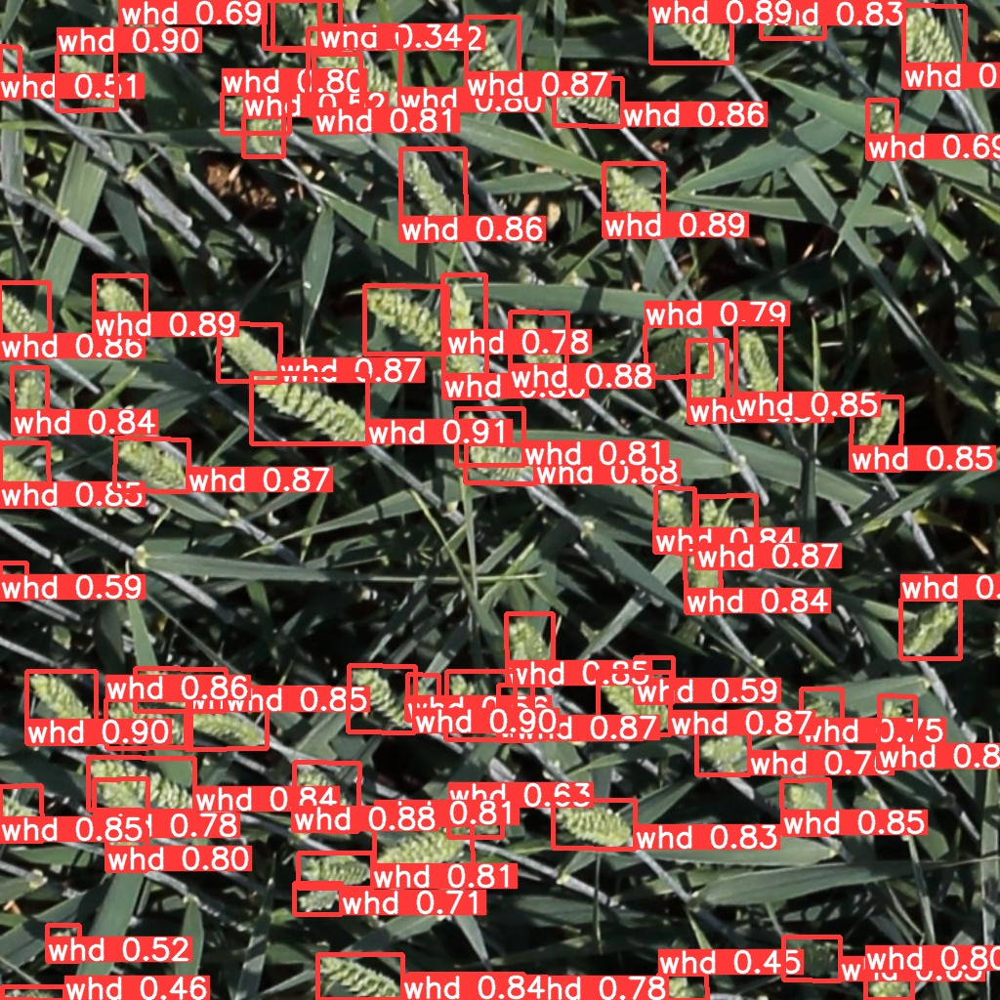

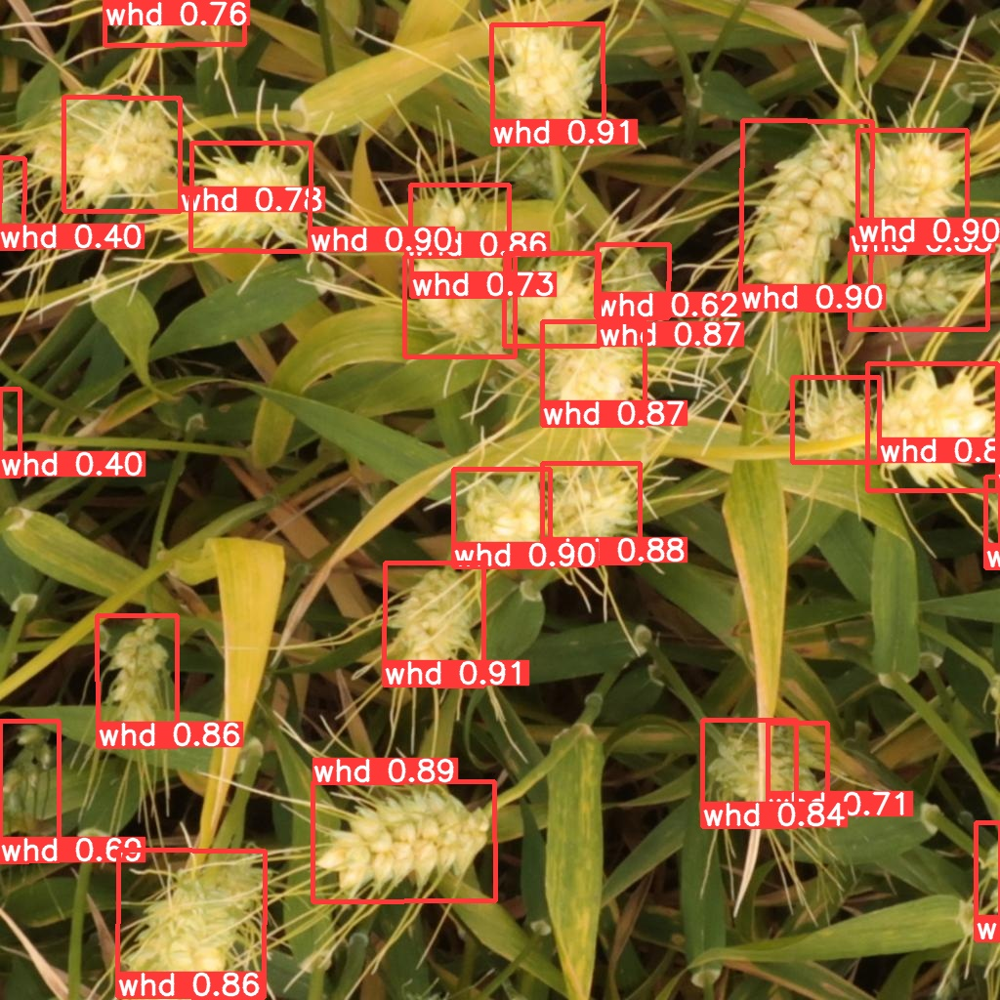

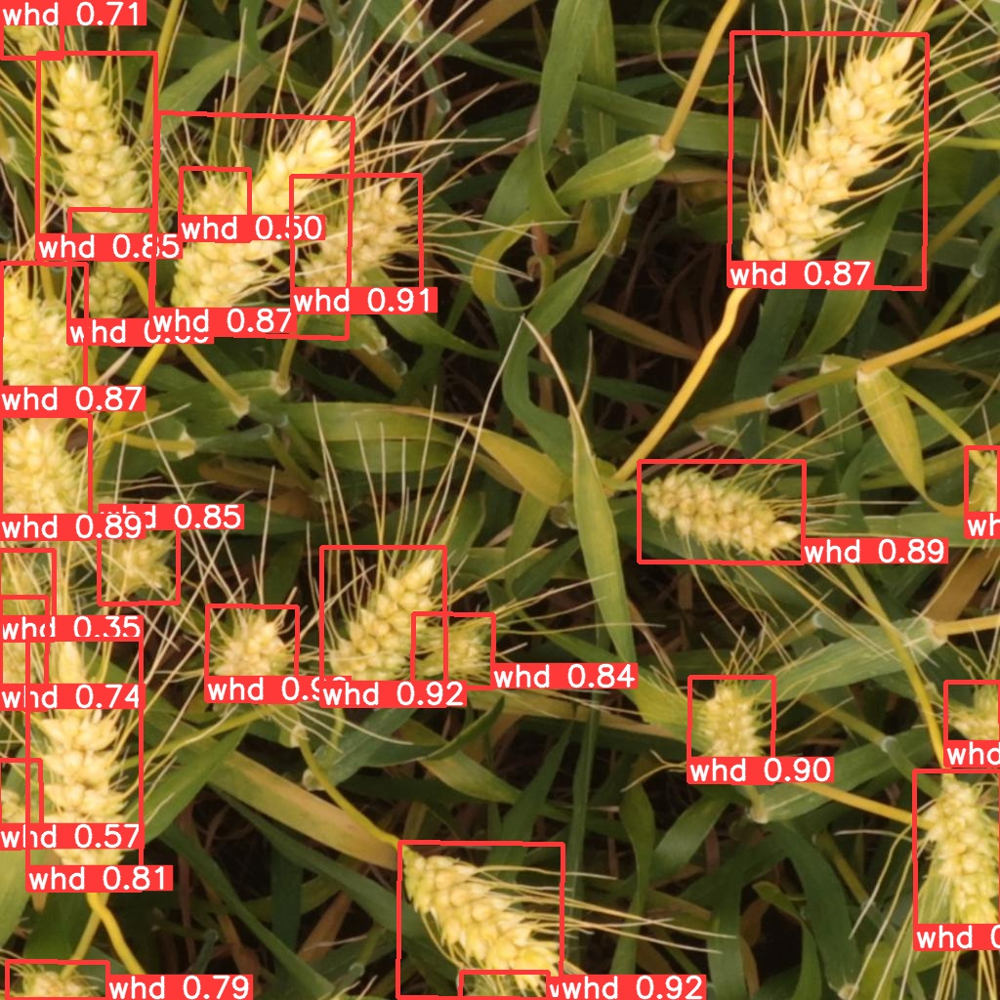

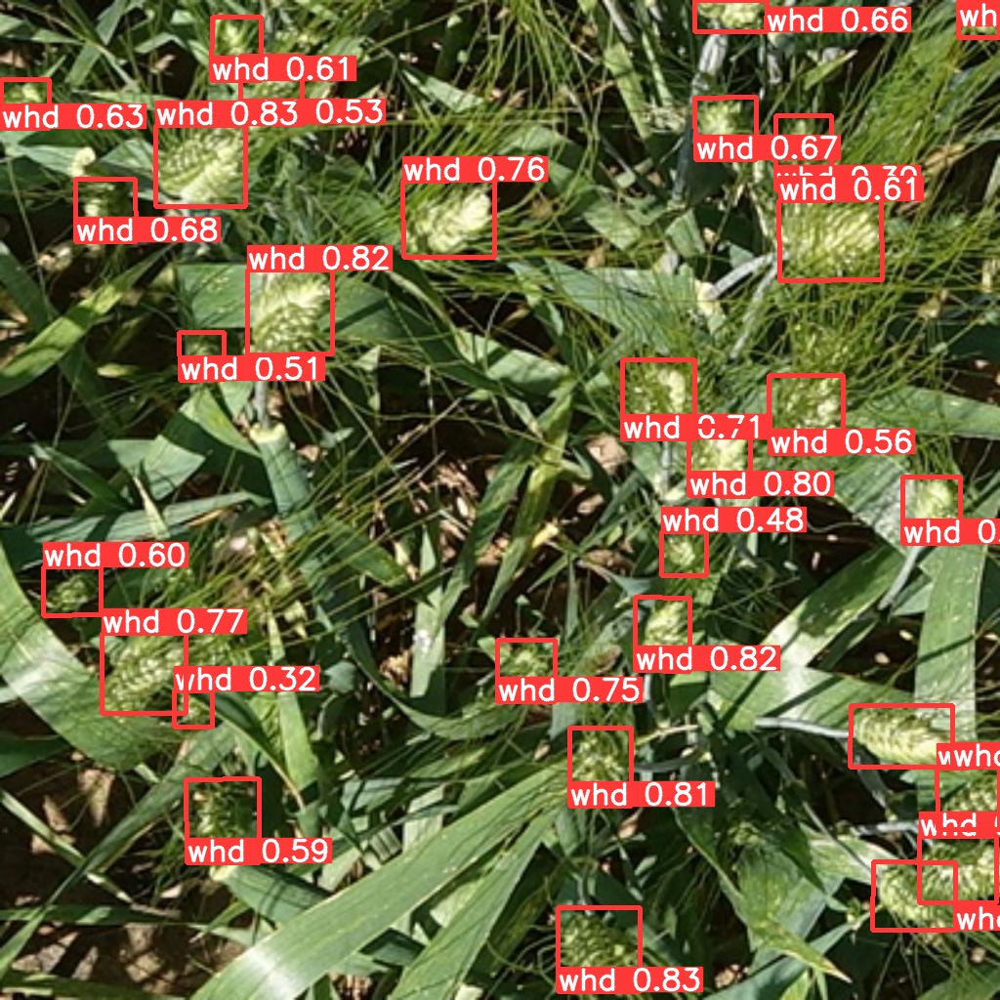

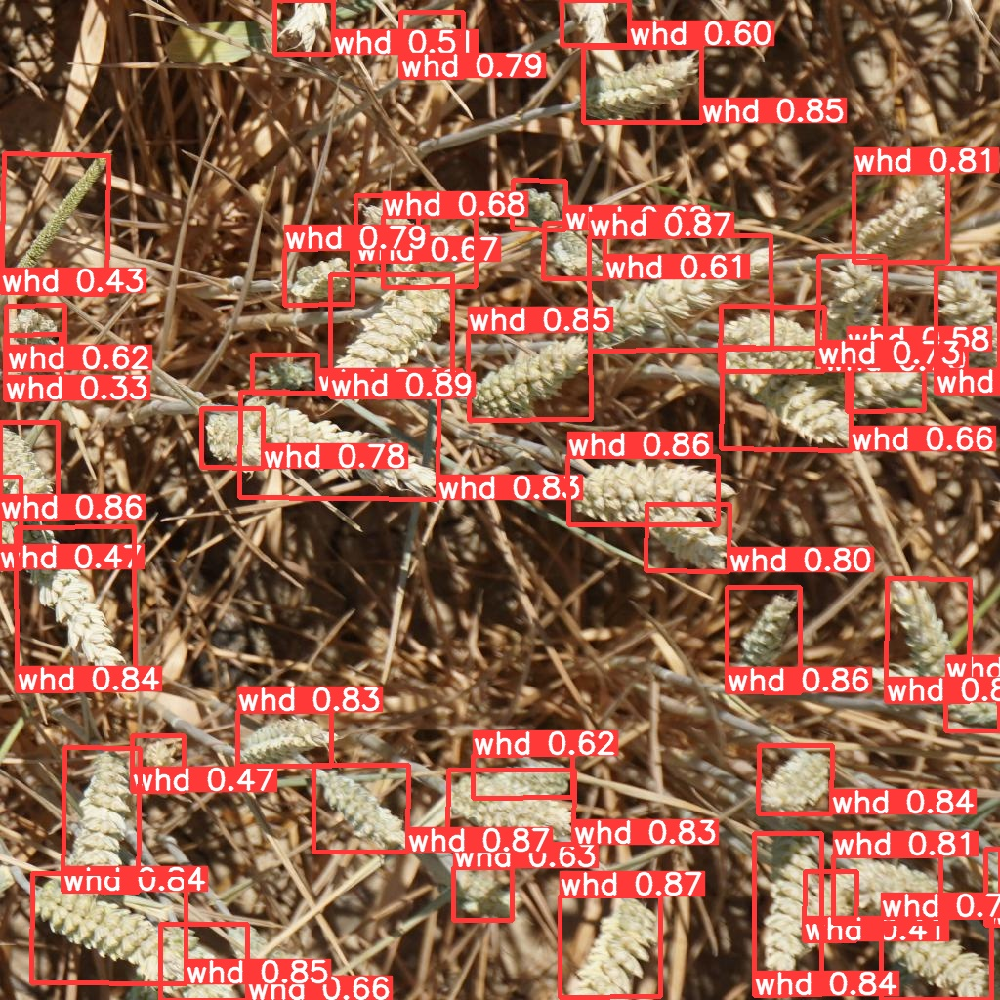

...

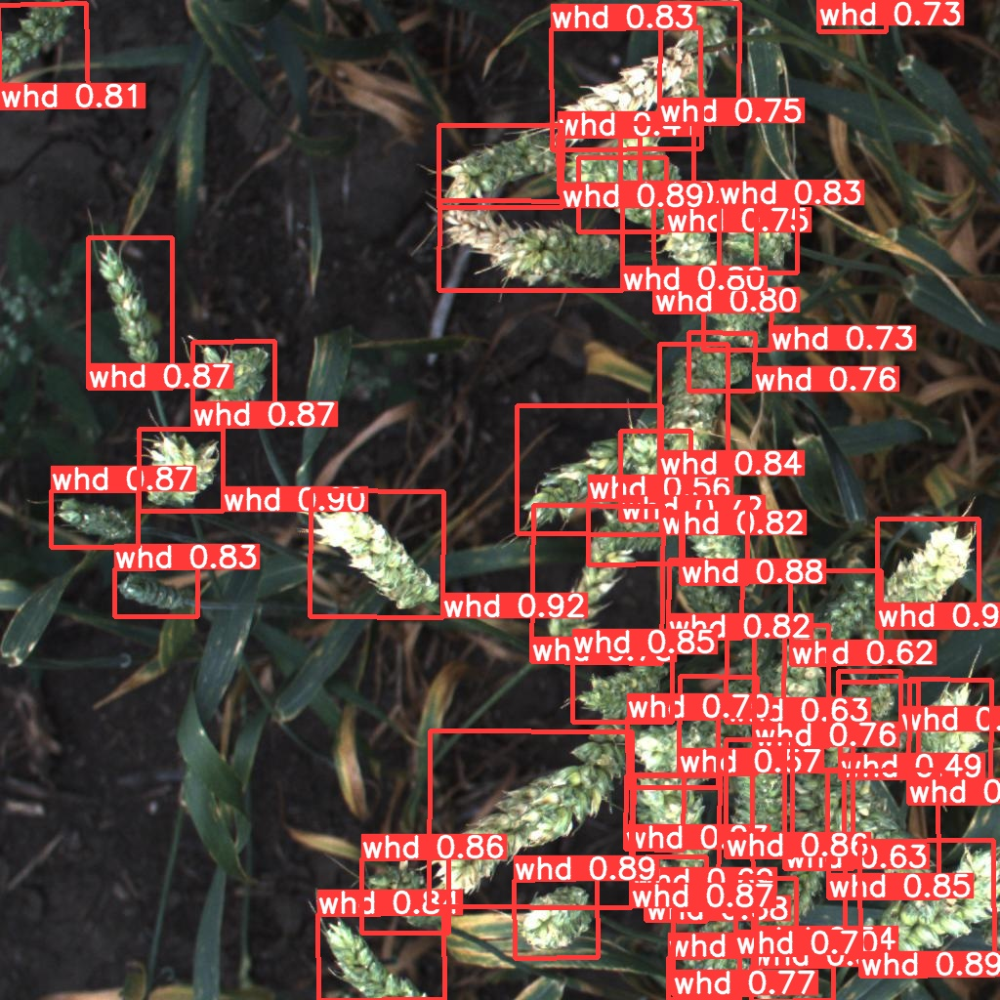

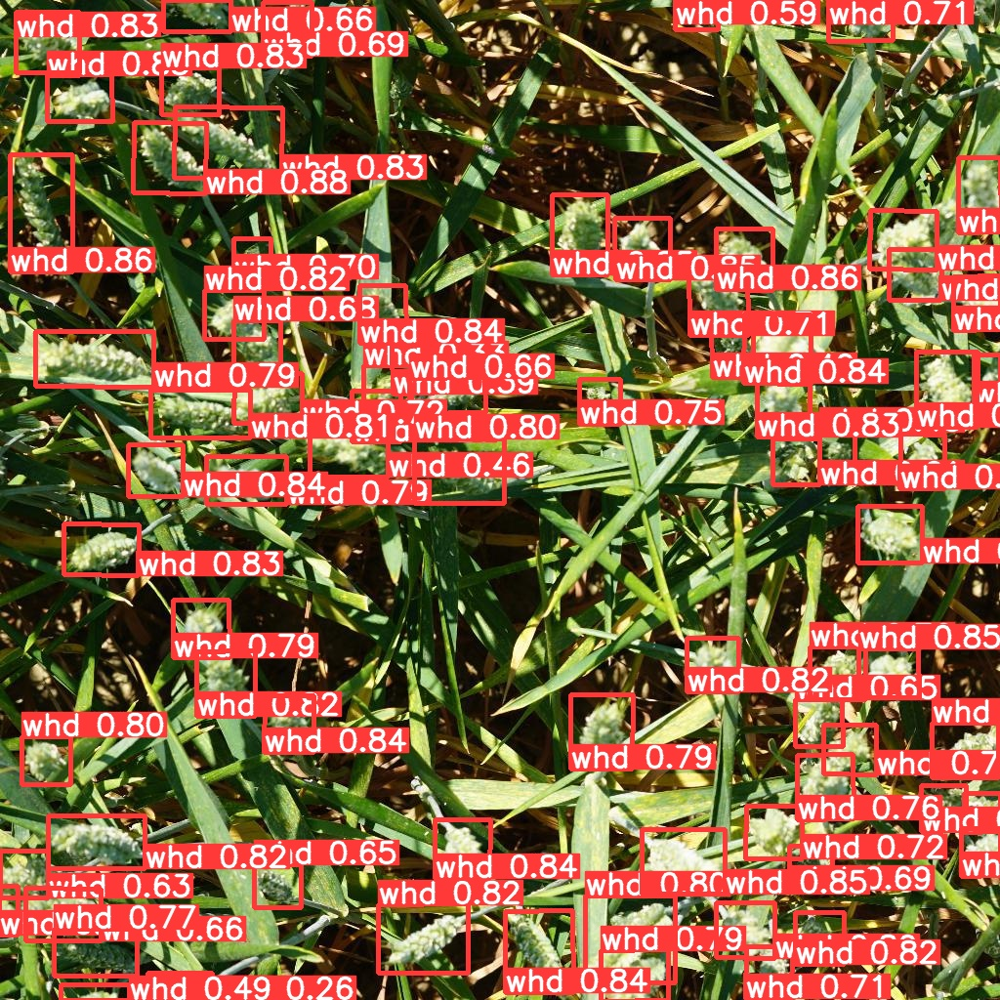

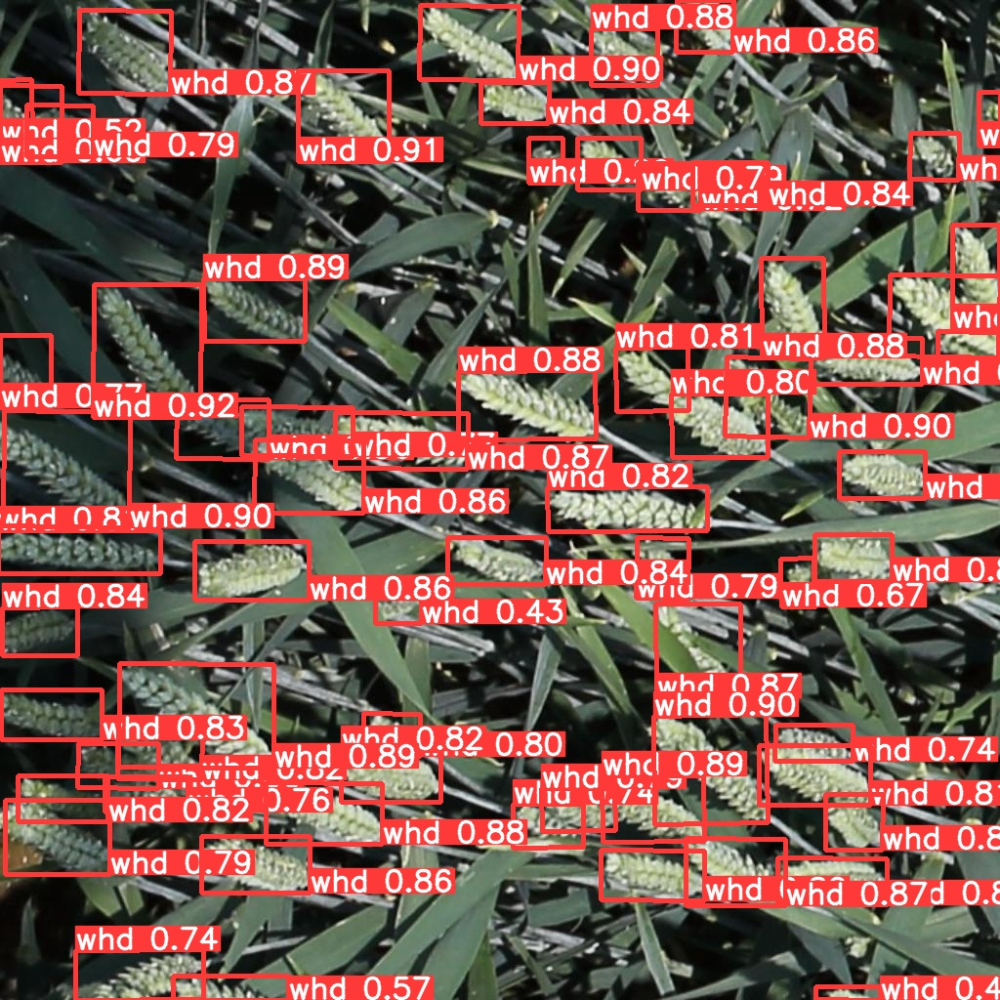

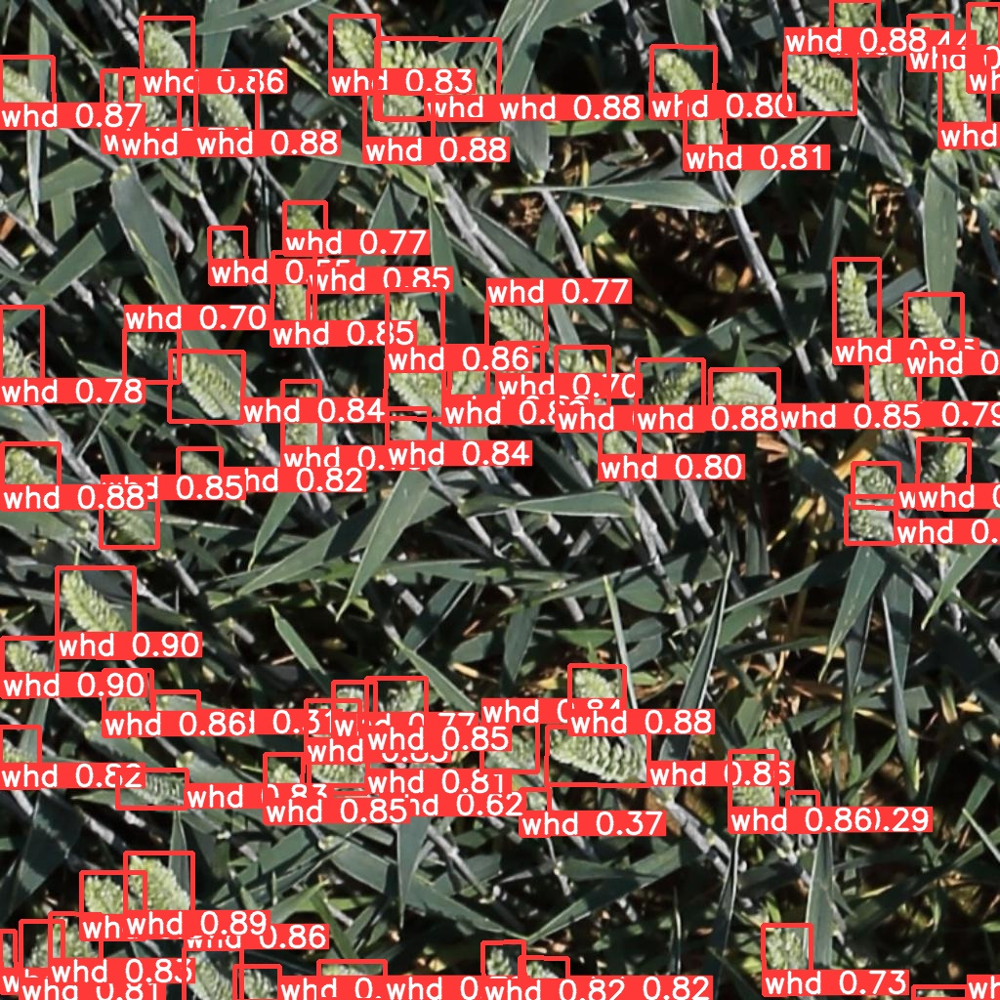

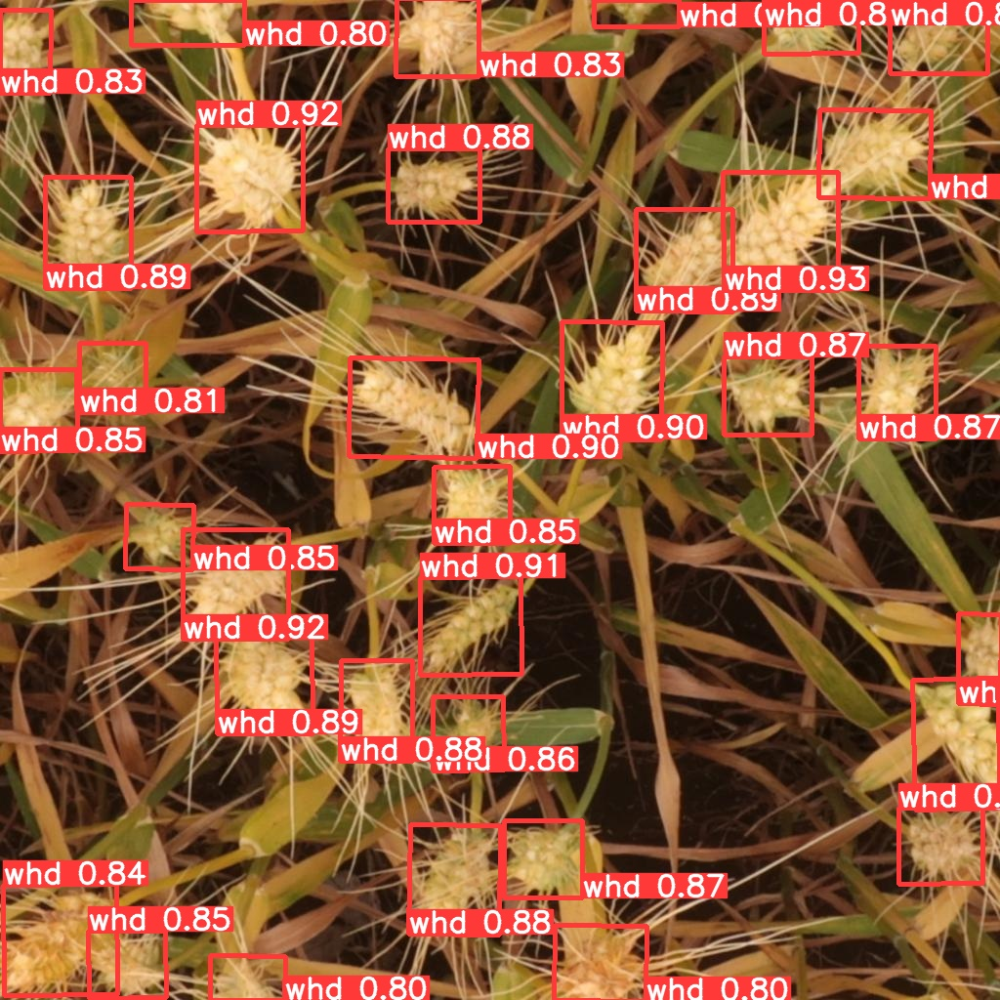

In [10]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/obb/predict/*.jpg')[:20]:
      display(Image(filename=image_path, width=600))
      print("\n")